# Deep Reinforment Learning in Stock Market Trading

## Abstract 

Our primary goal is to demystify the complexities of applying deep reinforcement learning to stock market trading. We provide detailed documentation of our methodology, including the preprocessing of data, the tuning of algoritm parameters, and interpretation of results. This will empower both researchers and professionals understand how to build models for their specific requirements and drive innovation in financial technology.

# 1.Introduction

The stock market is characterized by its high-dimensional, continuous, and dynamic nature, with data features such as Open, High, Low, Close, and Volume that evolve over time and exhibit complex non-linear interdependencies. Traditional Q-Learning struggles to handle such complexity due to its reliance on a discrete Q-table, which becomes impractically large and lacks the capacity for generalization and function approximation needed for effective decision-making in such environments. In contrast, Deep Q-Networks (DQN) leverage neural networks to approximate the Q-value function, enabling them to manage high-dimensional continuous state spaces and generalize across a wide range of market conditions. DQNs also incorporate experience replay and target networks, which enhance learning stability and efficiency, making them well-suited to adapt to the dynamic and noisy financial markets. Therefore, DQNs offer a powerful and scalable solution for developing robust trading strategies in the complex and volatile landscape of stock trading.

However, while standard DQNs provide significant improvements over traditional Q-learning, they are still susceptible to issues like overestimation of Q-values and lack of stability in volatile markets. In this context, we further discovered deep reinforcement learning techniques such as Double DQN and Dueling DQN approach to stock market prediction. These methods not only enhance the accuracy of predictions but also adapt dynamically to changing market conditions, offering significant advantages over traditional models. By enabling algorithms to learn and adapt their strategies based on dynamic market conditions, rathern than relying solely on historical data, DRL has the potential to uncover the hidden patterns and correlations in financial time series data that are often overlooked by traditional methods.

Our project aim to implement four distinct types of reinforcement learning algorithms to day trade the stock within dynamic market. We aim to explore and evaluate the performance of our models on various stock datasets including SPY and NVDA, providing a comprehensive analysis of each method's strengths and weaknesses. Through this project, we seek to provide a valuable insight into effective utilization of DRL into financial trading environment.

# 2.Solution Concept

## 2.1 Deep Q-Learning

## Deep Q-Network (DQN)

Deep Q-Network (DQN) represents a significant advancement in reinforcement learning, particularly in environments with large and complex state spaces where traditional Q-learning methods are inadequate. DQN integrates deep learning with Q-learning, employing deep neural networks to approximate the Q-value function, which estimates the maximum expected cumulative rewards for each action in a given state.

### Mathematical Formulation

Traditional Q-Learning Update:

$$ 
Q(s, a) \leftarrow Q(s, a) + \alpha \left[ r + \gamma \max_{a'} Q(s', a') - Q(s, a) \right] 
$$

DQN Q-Learning Update during Experience Replay:

$$ 
Q(s, a) \leftarrow Q(s, a) + \alpha\max_{a'}  \left[ r + \gamma Q(s', a') - Q(s, a) \right] 
$$

By applying Experience Replay under stock trading scenario through storing experiences in a replay buffer and sampling mini-batches randomly, it decreases the correlations between consecutive data points over time(asymtotically independent) and avoids overfiiting to recent data points, leading to more stable learning and accurate estimation. This random sampling also improves data efficiency by allowing each experience to be used multiple times. Additionally, experience replay stabilizes the learning process through mini-batch updates, reducing the variance in updates and helping the model converge more reliably. It also helps handle the non-stationary nature of stock markets by providing a diverse set of experiences from different market conditions(as each period of market has its own sentiment and unique factors like Covid, geo-conflicts etc.), enabling the model to generalize better and adapt to changing dynamics. These advantages make experience replay an essential component for effectively applying DQN to the complex and dynamic task of stock trading.


DQN Update The Network by Loss Function:

$$\mathcal{L}_t(\theta_t)=\mathbb{E}_{(s,a,r,s'){\sim}U(D)}[(r+{\gamma}\max_{a'}\hat{Q}(s',a';\theta_t)-\hat{Q}(s,a;\theta_t))^2]$$

Furthermore, by utilizing two clone networks, a frozen target network enhances DQN's performance by providing more stable and reliable target Q-values, which is crucial for handling the volatile and non-stationary nature of financial markets. By decoupling the Q-value predictions from the targets and updating the target network less frequently compares to policy network, DQN mitigates the moving target problem, reduces variance in updates, and ensures a smoother learning process. This stability is essential for developing robust trading strategies that can perform consistently over extended time scales. In the stock market, where stability and consistent profitability are key to long-term success—as exemplified by investors like Warren Buffet—a strategy with stable profitability tends to outperform others over time. 



## 2.2 Double Deep Q-Learning
### Overestimation in DQN

During our research, we noticed the DQN algorithm tends to result in overestimation of Q-values over time. 

This is due to the TD error target optimized by traditional DQN is:

$$
r + \gamma \max_{a'} Q(s', a')
$$

where max Q-value is calculated by the target network from optimal action: 

$$
Q \left( s', \arg \max_{a'} Q(s', a') \right)
$$

However, since the Q value calculation is result from optimal action in same target network, each selected action's Q-value will always be the maximum Q-value, when neural network produce error and positive error accumulated by argmax, the overestimation happens. 

### Double DQN

To solve this problem, the Double DQN algorithm leverages a separately trained neural network to calculate. Policy Q-network $Q(s',a';\theta_t)$ is used to select the action with the maximum Q-value, then the Q-value for this action is calculated using target Q-network $Q(s',a;\theta_t^{-})$. This way, even if a particular action has a significant positive estimation error in policy network, the final selected action’s Q-value will not result in a large overestimation due to the existence of target network.

1. Select Action:

$$
a = \arg \max_{a'} Q(s', a', \theta_t)
$$

2. Uses the target Q-network to evaluate the Q-value of the selected action  a':

$$
Q = r + \gamma Q(s', a, \theta_t^{-})
$$

## 2.3 Dueling Double Deep Q-Learning

For normal DQN, it estimates Q-values for each action in each state directly. This can be problematic in states where many actions have similar outcomes (e.g., holding or small transactions). In stock trading, it’s crucial to understand the value of a market condition independently of immediate actions. Dueling DQN can help the model learn to recognize valuable states more effectively by identify and ignore noisy or less important actions, leading to more informed trading decisions and improving the overall strategy. On the other hand, stability in learning is particularly important in the volatile and noisy environment of stock markets, more stable updates can lead to more reliable and consistent trading strategies. 

### Dueling DQN

In a Dueling DQN, the Q-value for a state-action pair $Q(s,a;\theta_t)$ (s, a) is computed by combining the state value $V(s)$ and the advantage $A(s, a)$ with mean advantage across all actions substracted:

$$
Q(s, a; \theta, \alpha, \beta) = V(s; \theta, \beta) + \left( A(s, a; \theta, \alpha) - \frac{1}{|\mathcal{A}|} \sum_{a'} A(s, a'; \theta, \alpha) \right) 
$$

![image.png](./image.png)

State Value Function (Value Function) $V(s; \theta, \beta)$: Represents the expected reward that the agent can obtain in a given state, regardless of the specific action taken. The state value function is used to measure the value of a state, indicating how much reward the agent expects to gain by being in that state.

Advantage Function $A(s, a; \theta, \alpha)$: Represents the advantage of taking different actions relative to the average in a given state. The advantage function measures the differences between various actions, indicating the impact of different actions relative to the average level.

After utlizing sharing neural networks and separately estimates the state value function and the advantage function in $\beta$ and $\alpha$ streams. This separation allows the model to better capture the inherent value of being in a specific state, independent of the specific actions taken. Whenever the $V(s)$ gets update, other actions Q value also being impacted, which helps Dualing DQN more frequently and accuratly learned.


### Double Dueling DQN

Therefore, we chose to testify how combining Dueling DQN and Double DQN could further improve our overall DQN strategy. 

# 4.Implementation

## Data and Feature Engineering

The datasets utilized in this project encompass historical stock data for SPY and NVDA, spanning a period of 10 years from 2014 to 2024. SPY represents the more stable overall market, and NVDA represents more fluctuate growth stock. Each dataset comprises daily records of stock prices, including the opening price, highest price of the day, lowest price of the day, closing price, adjusted closing price (accounting for dividends and stock splits), and the volume of shares traded. These features are pivotal for capturing the daily market behavior of the stocks, providing a comprehensive foundation for time series analysis. The extended 10-year period is particularly advantageous as it encapsulates various market cycles, including bull and bear markets, thus offering the model a broader understanding of different market conditions. Long-term trends and patterns in stock prices are more accurately captured with this extensive dataset, enhancing the predictive accuracy and robustness of the model by mitigating the risk of overfitting.

To evaluate the model's performance effectively, the data is divided into training and testing sets based on a specific date, 2018-07-01. This temporal split ensures that the training data consists of earlier periods, while the testing data comprises more recent periods, thereby mimicking real-world scenarios where past data is leveraged to predict future prices. Specifically, the NVDA dataset is split into train1 (data before 2018-07-01) and test1 (data from 2018-07-01 onwards), and the SPY dataset is split into train2 (data before 2018-07-01) and test2 (data from 2018-07-01 onwards). We decided to use only 1/3 data for training and 2/3 of data that contain different market environment for test so the model can achieve generalization in the long run.

## Importing important libraries

In [1]:
# building neural network models
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np # scientific computing
import copy # deep copy operations on data structures
from collections import deque # useful for maintaining a sequence of data
import random # generate random numbers and perform random sampling
import time # measure durations and delay processing
import pandas as pd # data manipulation and analysis
# interactive plotting
from plotly import tools
from plotly.graph_objs import *
from plotly.offline import init_notebook_mode, iplot, iplot_mpl
# more detailed plotting control
import plotly.graph_objects as go
import plotly.io as pio
from plotly.graph_objs import Candlestick, Figure, Layout
from plotly.subplots import make_subplots # create figure with mutiple subplots
import matplotlib.pyplot as plt # static, non-interactive plots
init_notebook_mode()

## Loading and Preparing Data

In [2]:
data = pd.read_csv('NVDA-10.csv')
data['Date'] = pd.to_datetime(data['Date'])
data = data.drop(['Adj Close'], axis=1)
data = data.set_index('Date')
data['Volume'] = data['Volume'] * 0.00001 #Normalized the huge value
data.head()

,Open,High,Low,Close,Volume
Date,,,,,
2014-05-19,4.5375,4.6600,4.5175,4.6350,360.076
2014-05-20,4.6150,4.6275,4.5375,4.5600,256.200
2014-05-21,4.5775,4.6175,4.5325,4.5600,216.712
2014-05-22,4.5500,4.6050,4.5500,4.5800,130.364
2014-05-23,4.6050,4.6450,4.5775,4.6225,182.656


In [3]:
data2 = pd.read_csv('SPY.csv')
data2['Date'] = pd.to_datetime(data2['Date'])
data2 = data2.drop(['Adj Close'], axis=1)
data2 = data2.set_index('Date')
data2['Volume'] = data2['Volume'] * 0.00001 #Normalized the huge value
data2.head()

,Open,High,Low,Close,Volume
Date,,,,,
2014-05-20,188.649994,188.669998,187.070007,187.550003,1116.440
2014-05-21,188.089996,189.220001,188.059998,189.130005,890.930
2014-05-22,189.179993,189.979996,188.860001,189.589996,615.490
2014-05-23,189.759995,190.479996,189.589996,190.350006,610.928
2014-05-27,191.059998,191.580002,190.949997,191.520004,720.100


## Exploratory Data Analysis

In [4]:
start_date = data.index.min()
end_date = data.index.max()
# Accessing the stock price data for the start and end dates
starting_price_open = data.loc[start_date, 'Open']
starting_price_close = data.loc[start_date, 'Close']
ending_price_open = data.loc[end_date, 'Open']
ending_price_close = data.loc[end_date, 'Close']
print(f"The starting time for this data is {start_date.strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Starting price (Open): ${starting_price_open:.2f}")
print(f"Starting price (Close): ${starting_price_close:.2f}")
print(f"The ending time for this data is {end_date.strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Ending price (Open): ${ending_price_open:.2f}")
print(f"Ending price (Close): ${ending_price_close:.2f}")

The starting time for this data is 2014-05-19 00:00:00
Starting price (Open): $4.54
Starting price (Close): $4.63
The ending time for this data is 2024-05-17 00:00:00
Ending price (Open): $943.69
Ending price (Close): $924.79


In [5]:
start_date = data2.index.min()
end_date = data2.index.max()
# Accessing the stock price data for the start and end dates
starting_price_open = data2.loc[start_date, 'Open']
starting_price_close = data2.loc[start_date, 'Close']
ending_price_open = data2.loc[end_date, 'Open']
ending_price_close = data2.loc[end_date, 'Close']
print(f"The starting time for this data is {start_date.strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Starting price (Open): ${starting_price_open:.2f}")
print(f"Starting price (Close): ${starting_price_close:.2f}")
print(f"The ending time for this data is {end_date.strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Ending price (Open): ${ending_price_open:.2f}")
print(f"Ending price (Close): ${ending_price_close:.2f}")

The starting time for this data is 2014-05-20 00:00:00
Starting price (Open): $188.65
Starting price (Close): $187.55
The ending time for this data is 2024-05-17 00:00:00
Ending price (Open): $528.81
Ending price (Close): $529.45


In [6]:
DATE_SPLIT = '2018-07-01'
train = data[:DATE_SPLIT]
test = data[DATE_SPLIT:]
train2 = data2[:DATE_SPLIT]
test2 = data2[DATE_SPLIT:]

In [7]:
print("Training Data Summary:")
print(train.describe())
print("\nTesting Data Summary:")
print(test.describe())

Training Data Summary:
              Open         High          Low        Close       Volume
count  1038.000000  1038.000000  1038.000000  1038.000000  1038.000000
mean     21.680313    21.975482    21.349220    21.682490   457.585457
std      19.670739    19.940861    19.343875    19.650979   311.741791
min       4.232500     4.325000     4.192500     4.197500    45.644000
25%       5.500000     5.556250     5.433125     5.505625   264.961000
50%      11.592500    11.746250    11.503750    11.601250   374.420000
75%      37.408751    37.975625    36.550002    37.469375   530.465000
max      66.250000    67.300003    65.904999    66.727501  3692.928000

Testing Data Summary:
              Open         High          Low        Close       Volume
count  1480.000000  1480.000000  1480.000000  1480.000000  1480.000000
mean    206.066402   209.859224   202.109797   206.184993   469.593946
std     195.880326   199.294293   192.029891   195.840503   206.611707
min      31.622499    32.494999

In [8]:
print("Training Data Summary:")
print(train2.describe())
print("\nTesting Data Summary:")
print(test2.describe())

Training Data Summary:
              Open         High          Low        Close       Volume
count  1037.000000  1037.000000  1037.000000  1037.000000  1037.000000
mean    222.938341   223.873597   221.916750   222.973230  1006.089376
std      25.991645    25.985795    25.951333    25.944220   500.716089
min     182.339996   184.100006   181.020004   182.860001   278.565000
25%     204.119995   205.479996   203.509995   204.240005   675.920000
50%     211.529999   212.320007   210.779999   211.630005   880.058000
75%     242.910004   243.529999   242.210007   242.949997  1179.754000
max     285.929993   286.630005   284.500000   286.579987  5072.443000

Testing Data Summary:
              Open         High          Low        Close       Volume
count  1480.000000  1480.000000  1480.000000  1480.000000  1480.000000
mean    374.761574   377.009135   372.349067   374.833649   842.783996
std      72.784855    72.905698    72.642668    72.810493   411.169330
min     228.190002   229.679993

In [9]:
print("Missing values in training data:")
print(train.isnull().sum())
print("\nMissing values in testing data:")
print(test.isnull().sum())

Missing values in training data:
Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64

Missing values in testing data:
Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64


In [10]:
print("Missing values in training data:")
print(train2.isnull().sum())
print("\nMissing values in testing data:")
print(test2.isnull().sum())

Missing values in training data:
Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64

Missing values in testing data:
Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64


## Ploting the Training and Testing Data

In [11]:
def plot_train_test(train, test, date_split):
    # Create trace for training data
    # The purpose of this function is to create an interactive candlestick plot of
    # the training and testing stock data using the Plotly library.
    trace1 = go.Candlestick(x=train.index,
                            open=train['Open'], high=train['High'],
                            low=train['Low'], close=train['Close'],
                            increasing_line_color='green', decreasing_line_color='red',
                            name='Train')
    # Create trace for testing data
    trace2 = go.Candlestick(x=test.index,
                            open=test['Open'], high=test['High'],
                            low=test['Low'], close=test['Close'],
                            increasing_line_color='blue', decreasing_line_color='purple',
                            name='Test')

    data = [trace1, trace2]
    # Define layout with annotations and shapes
    layout = go.Layout(
        title='Train and Test Data',
        xaxis_title="Date",
        yaxis_title="Price",
        xaxis_rangeslider_visible=False,
        shapes=[
            {'x0': date_split, 'x1': date_split, 'y0': 0, 'y1': 1, 'xref': 'x', 'yref': 'paper',
             'line': {'color': 'black', 'width': 2, 'dash': 'dot'}}
        ],
        annotations=[
            {'x': date_split, 'y': 0.95, 'xref': 'x', 'yref': 'paper', 'showarrow': True, 'xanchor': 'left', 'text': 'Test Start'},
            {'x': date_split, 'y': 0.95, 'xref': 'x', 'yref': 'paper', 'showarrow': True, 'xanchor': 'right', 'text': 'Train End'}
        ]
    )
    # Create figure with both data and layout
    fig = go.Figure(data=data, layout=layout)
    fig.show()

## Test and Training Plot NVDA

In [12]:
plot_train_test(train, test, DATE_SPLIT)

## Test and Training Plot SPY

In [13]:
plot_train_test(train2, test2, DATE_SPLIT)

## Creating Enviroment

In [14]:
# simulates a stock trading environment for a deep reinforcement learning agent
class Environment1:

    def __init__(self, data, history_t=50):
        self.data = data                # The historical price data
        self.history_t = history_t      # The number of time steps to consider for state representation
        self.reset()                    # Initialize the environment

    def reset(self):
        self.t = 0                      # Reset the time step to 0
        self.done = False               # Set the 'done' flag to False, indicating the environment is not finished
        self.profits = 0                # Reset the total profits
        self.positions = []             # Reset the list of open positions
        self.position_value = 0         # Reset the current value of the open positions
        self.empty_sell_counter = 0     # count how many times it try to sell when no position
        #self.history = [0 for _ in range(self.history_t)] # Initialize the price history with zeros
        self.history = [0 for _ in range(self.history_t * 5)]
        return [self.position_value] + self.history # Return the initial next_stateervation (state)

    def step(self, act, step_count, close_time):
        reward = 0                      # Initialize the reward to 0

        # act = 0: stay, 1: buy, 2: sell
        if act == 1:                    # If the action is 'buy'
            self.positions.append(self.data.iloc[self.t, :]['Close']) # Add the current closing price to positions
        elif act == 2: # sell
            if len(self.positions) == 0: # If there are no open positions
                reward = -1            # Apply a penalty of -1 as a reward
            else:
                temp_profits = 0
                for p in self.positions: # For each open position
                    temp_profits += (self.data.iloc[self.t, :]['Close'] - p) # Calculate profit
                reward += temp_profits      # Update the reward with the calculated profit
                self.profits += temp_profits # Update the total profit
                self.positions = []    # Close all positions

        # Set next time step
        self.t += 1
        self.position_value = 0
        for p in self.positions:       # Update the current value of all open positions
            self.position_value += (self.data.iloc[self.t, :]['Close'] - p)

        # Remove the oldest step data point from the history
        del self.history[0:5] 
        # Add the most recent step data to the history
        self.history.extend((self.data.iloc[self.t, :][:] - self.data.iloc[self.t - 1, :][:]).values.flatten().tolist())
        # Clipping reward
        if reward > 0:
           reward = 1
              # If the reward is positive, set it to 1
        elif reward < 0:
            reward = -1                # If the reward is negative, set it to -1

        return [self.position_value] + self.history, reward, self.done # Return the new next_stateervation (state), reward, and done status

## Creating an instance of the environment

In [15]:
# creating an instance of the Environment1 class and testing it with random actions
env = Environment1(train)
print(env.reset())
for _ in range(3):
    action = np.random.randint(3)
    print(env.step(action, 1, 2))

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

In [16]:
# creating an instance of the Environment1 class and testing it with random actions
env = Environment1(train2)
print(env.reset())
for _ in range(3):
    action = np.random.randint(3)
    print(env.step(action, 1, 2))

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

In [17]:
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

## Replay Buffer Implementation

It provides a mechanism for storing and sampling experiences (or transitions) collected during the training process. This class facilitates the experience replay technique, which helps in breaking the correlation between consecutive learning steps, thereby stabilizing and improving the learning process.

In [18]:
class ReplayBuffer:
    #Fixed-size buffer to store experience tuples
    #Initialize a ReplayBuffer object.
    #action_size (int): dimension of each action
    #buffer_size (int): maximum size of buffer
    #batch_size (int): size of each training batch
    #seed (int): random seed

    def __init__(self, action_size, buffer_size, batch_size, seed):

        self.memory = deque(maxlen=buffer_size)
        self.batch_size = batch_size

    def add(self, state, action, reward, next_state, done):
        #Add a new experience to memory
        self.memory.append((state, action, reward, next_state, done))

    def sample(self):
        #Randomly sample a batch of experiences from memory, and convert
        experiences = random.sample(self.memory, k=self.batch_size)
        sample_state, sample_action, sample_reward, sample_next_state, sample_done = zip(*experiences)


        states = torch.from_numpy(np.vstack(sample_state, dtype=np.float32)).to(device)
        actions = torch.tensor(sample_action, dtype=torch.int64).to(device).unsqueeze(1)
        rewards = torch.tensor(sample_reward, dtype=torch.float32).to(device)
        next_states = torch.from_numpy(np.vstack(sample_next_state, dtype=np.float32)).to(device)
        dones = torch.tensor(sample_done, dtype=torch.bool).to(device)


        return (states, actions, rewards, next_states, dones)

    def __len__(self):
        #Return the current size of internal memory.
        return len(self.memory)

## Training DQN
The goal is for the DQN to learn to optimize actions based on historical data in order to maximize future rewards (financial returns). The training involves updating the Q-network to better predict rewards and improve trading strategies over time.

In [19]:
# Define a custom neural network architecture that inherits from nn.Module
class Q_Network(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(Q_Network, self).__init__()
        # Define three fully connected layers
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.fc4 = nn.Linear(hidden_size, output_size)
        self.dropout = nn.Dropout(p=0.1)

    def forward(self, x):
        # Apply ReLU activation to the output of the first two layers
        x = F.relu(self.fc1(x))
        x = self.dropout(F.relu(self.fc2(x)))
        #x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        return self.fc4(x)

# Define the training procedure for the Q-Network using a given environment
def train_dqn(env):
    # Initialize local and target Q-networks
    qnetwork_local = Q_Network(input_size=env.history_t * 5 + 1, hidden_size=64, output_size=3).to(device)
    qnetwork_target = copy.deepcopy(qnetwork_local).to(device)
    # Define optimizer for updating weights of the local network
    optimizer = optim.Adam(qnetwork_local.parameters(), lr=5e-4)

    epoch_num = 200 # Number of training epochs
    step_max = len(env.data) - 1 # Maximum number of steps per epoch
    buffer_size = 1000 # Buffer size for the replay buffer
    batch_size = 64 # Batch size for training
    epsilon = 1.0 # Initial value for epsilon-greedy exploration
    epsilon_decrease = 5e-4 # Decrease rate for epsilon
    epsilon_min = 0.1 # Minimum value for epsilon
    start_reduce_epsilon = 200 # The step at which epsilon starts decreasing
    train_every = 10 # Frequency of training updates
    hard_update_every = 20 # Frequency of syncing target network
    gamma = 0.97 # Discount factor for future rewards
    show_log_freq = 5 # Frequency of showing the training logs
    memory = ReplayBuffer(action_size=3, buffer_size=buffer_size, batch_size=batch_size, seed=0)

    total_step = 0
    total_rewards = [] # Track rewards per epoch
    total_losses = [] # Track losses per epoch
    all_q_values = []

    start = time.time()
    for epoch in range(epoch_num):
        state = env.reset() # Reset environment to start state
        step = 0
        done = False
        total_reward = 0
        total_loss = 0
        max_next_q_values_list = [0]

        while not done and step < step_max:
            action = random.randint(0, 2) # Random action for exploration
            if np.random.rand() > epsilon: # Epsilon-greedy action selection
                # Adds an extra dimension at the 0th position and covert the shape of state
                action = qnetwork_local(torch.from_numpy(np.array(state, dtype=np.float32)).unsqueeze(0).to(device))
                action = torch.argmax(action.data).item()


            next_state, reward, done = env.step(action, 1, 3) # Take action, observe new state and reward
            memory.add(state, action, reward, next_state, done) # Store experience in replay memory

            # Train the network every 'train_every' steps and if memory is sufficient
            if len(memory) == buffer_size and total_step % train_every == 0:
                sample_state, sample_action, sample_reward, sample_next_state, sample_done = memory.sample()

                q_values = qnetwork_local(sample_state).gather(1, sample_action).squeeze(1)
                max_next_q_values = qnetwork_target(sample_next_state).max(1)[0]
                target_q_values = sample_reward + gamma * max_next_q_values * (~sample_done)

                loss = F.mse_loss(q_values, target_q_values)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                total_loss += loss.item()
                max_next_q_values_list.extend(max_next_q_values.cpu().detach().numpy())

            # Update target network weights from local network weights
            if total_step % hard_update_every == 0:
                qnetwork_target = copy.deepcopy(qnetwork_local)

            if epsilon > epsilon_min and total_step > start_reduce_epsilon:
                epsilon -= epsilon_decrease

            total_reward += reward
            state = next_state
            step += 1
            total_step += 1

        total_rewards.append(total_reward)
        total_losses.append(total_loss)
        max_next_q_values_mean = np.mean(max_next_q_values_list)
        all_q_values.append(max_next_q_values_mean)
        # Logging progress
        if (epoch + 1) % show_log_freq == 0:
            log_reward = sum(total_rewards[-show_log_freq:]) / show_log_freq
            log_loss = sum(total_losses[-show_log_freq:]) / show_log_freq
            elapsed_time = time.time() - start
            print(f"Epoch: {epoch + 1}, Epsilon: {epsilon:.4f}, Steps: {total_step}, Avg Reward: {log_reward:.2f}, Avg Loss: {log_loss:.4f}, Time: {elapsed_time:.2f}s, max_step: {step_max}")
            start = time.time()

    return qnetwork_local, total_losses, total_rewards, all_q_values


## Loss and Reward Visualization

This function visualizes the progression of training in terms of how the model's loss decreases and its rewards (potentially reflecting the effectiveness of its decisions) change over time.

In [50]:
def plot_loss_reward(total_losses, total_rewards, all_q_values):
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=('Total Loss', 'Total Reward')
    )
    fig.add_trace(
        go.Scatter(y=total_losses, mode='lines', line=dict(color='red'), name='Total Loss'),
        row=1, col=1
    )
    fig.add_trace(
        go.Scatter(y=total_rewards, mode='lines', line=dict(color='green'), name='Total Reward'),
        row=1, col=2
    )
    fig.add_trace(
    go.Scatter(y=all_q_values, mode='lines', line=dict(color='blue'), name='All Q Value'),
    row=2, col=1
    )
    fig.update_xaxes(title_text='Epoch', row=1, col=1)
    fig.update_xaxes(title_text='Epoch', row=1, col=2)
    fig.update_xaxes(title_text='Epoch', row=2, col=1)
    fig.update_layout(
        height=850, width=850,
        showlegend=True,
        title='Training Total Loss and Total Reward over Epochs',
        title_x=0.5,
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        )
    )
    fig.show()

## Candlestick Charts
Visualizes the decisions (actions) taken by different deep reinforcement learning models on both training and testing environments using candlestick charts, which are often used in financial analysis. This visualization helps to evaluate the model's performance in terms of its trading strategy (buy, sell, hold) and the resulting financial outcomes.

In [21]:
def plot_train_test_by_q(train_env, test_env, Q, algorithm_name):
    # Ensure the model is in evaluation mode
    Q.eval()

    # Function to generate plots for a given environment
    def generate_plot_data(env, Q):
        acts = []
        rewards = []
        pobs = env.reset()

        for i in range(len(env.data) - 1):
            tensor_pobs = Q(torch.from_numpy(np.array(pobs, dtype=np.float32)).unsqueeze(0).to(device))
            #action = torch.argmax(Q(tensor_pobs).data).item()
            action = torch.argmax(tensor_pobs.data).item()
            acts.append(action)
            obs, reward, done = env.step(action, i, len(env.data) - 1)
            rewards.append(reward if reward is not None else 0)
            pobs = obs

        profits = env.profits if env.profits is not None else 0
        temp_env = copy.deepcopy(env)
        temp_env.data['Action'] = acts + [np.nan]  # Append nan for last missing action
        temp_env.data['Reward'] = rewards + [np.nan]  # Append nan for last missing reward
        return temp_env.data, profits

    train_data, train_profits = generate_plot_data(train_env, Q)
    test_data, test_profits = generate_plot_data(test_env, Q)

    # Function to create a candlestick chart for specified actions
    def create_candlestick(data, action, color, label):
        filtered_data = data[data['Action'] == action]
        return go.Candlestick(
            x=filtered_data.index,
            open=filtered_data['Open'], high=filtered_data['High'],
            low=filtered_data['Low'], close=filtered_data['Close'],
            increasing_line_color=color, decreasing_line_color=color,
            name=label
        )

    action_labels = {0: 'Hold', 1: 'Buy', 2: 'Sell'}
    action_colors = ['#FF6347', '#4682B4', '#32CD32']  # Tomato, SteelBlue, LimeGreen

    traces = [create_candlestick(train_data, i, action_colors[i], action_labels[i]) for i in range(3)]
    traces += [create_candlestick(test_data, i, action_colors[i], action_labels[i]) for i in range(3)]

    # compares to profit of buy in then hold until last day to sell
    #sum_buy = test_data.loc[(test_data['Action'] == 1), 'Close'].sum()
    #hold_profit = np.nansum(test_data["Reward"]) * float(test_data.iloc[-1]['Close']) - sum_buy

    layout = go.Layout(
        title=f'{algorithm_name}: Train s-reward {np.nansum(train_data["Reward"]):.2f}, Profits {train_profits:.2f}<br> \
            Test s-reward {np.nansum(test_data["Reward"]):.2f}, Profits {test_profits:.2f}',
        xaxis_title='Date',
        yaxis_title='Price',
        showlegend=True,
        legend_title='Actions',
        template='plotly_white',
        xaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey'),
        yaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey')
    )

    fig = go.Figure(data=traces, layout=layout)
    fig.update_layout(font=dict(family="Courier New, monospace", size=12, color="#A9A9A9"))
    fig.show()

## Training Double DQN
This code implements a Double DQN, which is a refinement of the standard DQN algorithm that aims to reduce the overestimation of Q-values. It uses two networks, the local and target, to decouple the selection of actions from the generation of target Q-values during training, leading to more stable and reliable learning. This architecture is particularly useful in environments with high variance in action outcomes, such as stock trading, where it can help manage the risk and volatility associated with financial investments.

In [23]:
# Double DQN
# Define a neural network for approximating the Q-value function in a Double DQN setup
class Q_Network(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(Q_Network, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.fc4 = nn.Linear(hidden_size, output_size)
        self.dropout = nn.Dropout(p=0.1)

    def forward(self, x):
        # Apply ReLU activation function to the first two layers and output the final layer results
        x = F.relu(self.fc1(x))
        x = self.dropout(F.relu(self.fc2(x)))
        x = F.relu(self.fc3(x))
        return self.fc4(x)

# Function to train the Double DQN model
def train_ddqn(env):
    # Initialize the local (for learning) and target (for stability) Q-networks
    qnetwork_local = Q_Network(input_size=env.history_t * 5 + 1, hidden_size=64, output_size=3).to(device)
    qnetwork_target = copy.deepcopy(qnetwork_local).to(device)
    # Define optimizer for updating weights of the local network
    optimizer = optim.Adam(qnetwork_local.parameters(), lr=5e-4)

    epoch_num = 200 # Number of training epochs
    step_max = len(env.data) - 1 # Maximum number of steps per epoch
    buffer_size = 1000 # Buffer size for the replay buffer
    batch_size = 64 # Batch size for training
    epsilon = 1.0 # Initial value for epsilon-greedy exploration
    epsilon_decrease = 5e-4 # Decrease rate for epsilon
    epsilon_min = 0.1 # Minimum value for epsilon
    start_reduce_epsilon = 200 # The step at which epsilon starts decreasing
    train_every = 10 # Frequency of training updates
    hard_update_every = 20 # Frequency of syncing target network
    gamma = 0.97 # Discount factor for future rewards
    show_log_freq = 5 # Frequency of showing the training logs

    # Initialize the replay buffer
    memory = ReplayBuffer(action_size=3, buffer_size=buffer_size, batch_size=batch_size, seed=0)

    total_step = 0
    total_rewards = []
    total_losses = []
    all_q_values = []

    start = time.time()
    for epoch in range(epoch_num):
        state = env.reset()
        step = 0
        done = False
        total_reward = 0
        total_loss = 0
        max_next_q_values_list = []

        while not done and step < step_max:
            if random.random() > epsilon:
                # Use the local network to choose the best action based on current policy
                action = qnetwork_local(torch.from_numpy(np.array(state, dtype=np.float32)).unsqueeze(0).to(device))
                action = torch.argmax(action.data).item()
                # Select a random action (exploration)
            else:
                action = random.randint(0, 2)
            # Execute the chosen action in the environment
            next_state, reward, done = env.step(action, 1, 3)
            # Store the experience in the replay buffer
            memory.add(state, action, reward, next_state, done)

            # Learn from experiences by updating the network every 'train_every' steps
            if len(memory) == buffer_size and total_step % train_every == 0:
                sample_state, sample_action, sample_reward, sample_next_state, sample_done = memory.sample()

                q_values = qnetwork_local(sample_state).gather(1, sample_action).squeeze(1)
                # Select the best next action using the local network (policy improvement)
                max_action = qnetwork_local(sample_next_state).max(1)[1].unsqueeze(1)
                # Get the target Q-value for the best next action from the target network
                max_next_q_values = qnetwork_target(sample_next_state).gather(1, max_action).squeeze(1)
                # Compute the target Q-values for the current actions (TD target)
                target_q_values = sample_reward + gamma * max_next_q_values * (~sample_done)
                # Calculate loss and perform a gradient descent step to update the network
                loss = F.mse_loss(q_values, target_q_values)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                total_loss += loss.item()
                max_next_q_values_list.extend(max_next_q_values.cpu().detach().numpy())

            # Periodically update the weights of the target network to the local network
            if total_step % hard_update_every == 0:
                qnetwork_target.load_state_dict(qnetwork_local.state_dict())
            # Decrease epsilon according to schedule to reduce the amount of exploration over time
            if epsilon > epsilon_min and total_step > start_reduce_epsilon:
                epsilon -= epsilon_decrease
            # Update totals for rewards and steps
            total_reward += reward
            state = next_state
            step += 1
            total_step += 1
        # Store the total reward and loss for this epoch
        total_rewards.append(total_reward)
        total_losses.append(total_loss)
        max_next_q_values_mean = np.mean(max_next_q_values_list)
        all_q_values.append(max_next_q_values_mean)
        # Log training progress at specified intervals
        if (epoch+1) % show_log_freq == 0:
            log_reward = sum(total_rewards[-show_log_freq:]) / show_log_freq
            log_loss = sum(total_losses[-show_log_freq:]) / show_log_freq
            log_q = sum(all_q_values[-show_log_freq:]) / show_log_freq
            elapsed_time = time.time() - start
            print(f'Epoch: {epoch+1}, Epsilon: {epsilon}, Total Step: {total_step}, Avg Reward: {log_reward}, Avg Loss: {log_loss}, Time: {elapsed_time}s, avg_Q: {log_q}')
            start = time.time()

    return qnetwork_local, total_losses, total_rewards, all_q_values


# Training Dueling Double DQN

The Dueling Double DQN combines the dueling architecture with the Double DQN approach to mitigate the overestimation bias in Q-learning.

In [24]:
# Dualing Double DQN
class Q_Network_dddqn(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(Q_Network_dddqn, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        # Split into two streams:
        # Stream for state value function
        self.fc_V = nn.Linear(hidden_size, hidden_size // 2)
        self.fc_V_ouput = nn.Linear(hidden_size // 2, 1)
        #self.fc3 = nn.Linear(hidden_size, hidden_size)
        # Stream for advantage function
        self.fc_A = nn.Linear(hidden_size, hidden_size // 2)
        self.fc_A_output = nn.Linear(hidden_size // 2, output_size)
        #self.fc4 = nn.Linear(hidden_size, hidden_size)

        self.dropout = nn.Dropout(p=0.1)


    def forward(self, x):
        # Common layers
        x = F.relu(self.fc1(x))
        x = self.dropout(F.relu(self.fc2(x)))
        #x = F.relu(self.fc2(x))
        # State value path
        temp_V = F.relu(self.fc_V(x))
        V_value = self.fc_V_ouput(temp_V)
        # Advantage value path
        temp_A = F.relu(self.fc_A(x))
        A_value = self.fc_A_output(temp_A)
        # Combine state and advantage to compute final Q-values
        A_mean = A_value.mean(dim=1, keepdim=True)
        Q_value = V_value + (A_value - A_mean)
        return Q_value

def train_dddqn(env):
    # Initialize the local and target networks with the same weights

    qnetwork_local = Q_Network_dddqn(input_size=env.history_t * 5 + 1, hidden_size=64, output_size=3).to(device)
    qnetwork_target = copy.deepcopy(qnetwork_local).to(device)
    # Define optimizer for updating weights of the local network
    optimizer = optim.Adam(qnetwork_local.parameters(), lr=5e-4)
    #qnetwork_local.train()

    epoch_num = 200 # Number of training epochs
    step_max = len(env.data) - 1 # Maximum number of steps per epoch
    buffer_size = 1000 # Buffer size for the replay buffer
    batch_size = 64 # Batch size for training
    epsilon = 1.0 # Initial value for epsilon-greedy exploration
    epsilon_decrease = 5e-4 # Decrease rate for epsilon
    epsilon_min = 0.1 # Minimum value for epsilon
    start_reduce_epsilon = 200 # The step at which epsilon starts decreasing
    train_every = 10 # Frequency of training updates
    hard_update_every = 20 # Frequency of syncing target network
    gamma = 0.97 # Discount factor for future rewards
    show_log_freq = 5 # Frequency of showing the training logs

    # Initialize the replay buffer
    memory = ReplayBuffer(action_size=3, buffer_size=buffer_size, batch_size=batch_size, seed=0)

    total_step = 0
    total_rewards = []
    total_losses = []
    all_q_values = []

    start = time.time()
    for epoch in range(epoch_num):
        state = env.reset()
        step = 0
        done = False
        total_reward = 0
        total_loss = 0
        max_next_q_values_list = []

        while not done and step < step_max:
            # Select an action using epsilon-greedy policy
            if random.random() > epsilon:
                action = qnetwork_local(torch.from_numpy(np.array(state, dtype=np.float32)).unsqueeze(0).to(device))
                action = torch.argmax(action.data).item()
            else:
                action = random.randint(0, 2)
            # Take the action and observe the next state and reward
            next_state, reward, done = env.step(action, 1, 3)
            memory.add(state, action, reward, next_state, done)

            # Learning phase
            if len(memory) == buffer_size and total_step % train_every == 0:
                sample_state, sample_action, sample_reward, sample_next_state, sample_done = memory.sample()

                q_values = qnetwork_local(sample_state).gather(1, sample_action).squeeze(1)
                # Select the best next action using the local network (policy improvement)
                max_action = qnetwork_local(sample_next_state).max(1)[1].unsqueeze(1)
                # Get the target Q-value for the best next action from the target network
                max_next_q_values = qnetwork_target(sample_next_state).gather(1, max_action).squeeze(1)
                # Compute the target Q-values for the current actions (TD target)
                target_q_values = sample_reward + gamma * max_next_q_values * (~sample_done)

                loss = F.mse_loss(q_values, target_q_values)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                total_loss += loss.item()
                max_next_q_values_list.extend(max_next_q_values.cpu().detach().numpy())

            # Update the target network periodically
            if total_step % hard_update_every == 0:
                qnetwork_target.load_state_dict(qnetwork_local.state_dict())
            # Decrease epsilon for less exploration over time
            if epsilon > epsilon_min and total_step > start_reduce_epsilon:
                epsilon -= epsilon_decrease

            total_reward += reward
            state = next_state
            step += 1
            total_step += 1

        total_rewards.append(total_reward)
        total_losses.append(total_loss)
        max_next_q_values_mean = np.mean(max_next_q_values_list)
        all_q_values.append(max_next_q_values_mean)
        # Log training results periodically
        if (epoch + 1) % show_log_freq == 0:
            log_reward = sum(total_rewards[-show_log_freq:]) / show_log_freq
            log_loss = sum(total_losses[-show_log_freq:]) / show_log_freq
            elapsed_time = time.time() - start
            print(f'Epoch: {epoch + 1}, Epsilon: {epsilon}, Total Step: {total_step}, Avg Reward: {log_reward}, Avg Loss: {log_loss}, Time: {elapsed_time}')
            start = time.time()

    return qnetwork_local, total_losses, total_rewards, all_q_values

# Training Dueling DQN

This implementation of a dueling DQN for stock forecasting aims to enhance the learning efficiency and stability of the Q-learning process by decoupling the estimation of state values and action advantages, as well as leveraging the double DQN approach to mitigate overestimation biases.

In [25]:
# Dueling DQN
class Q_Network_ddqn(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(Q_Network_ddqn, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        # Split into two streams:
        # Stream for state value function
        self.fc_V = nn.Linear(hidden_size, hidden_size // 2)
        self.fc_V_ouput = nn.Linear(hidden_size // 2, 1)
        #self.fc3 = nn.Linear(hidden_size, hidden_size)
        # Stream for advantage function
        self.fc_A = nn.Linear(hidden_size, hidden_size // 2)
        self.fc_A_output = nn.Linear(hidden_size // 2, output_size)
        #self.fc4 = nn.Linear(hidden_size, hidden_size)

        self.dropout = nn.Dropout(p=0.1)


    def forward(self, x):
        # Common layers
        x = F.relu(self.fc1(x))
        x = self.dropout(F.relu(self.fc2(x)))
        # State value path
        temp_V = F.relu(self.fc_V(x))
        V_value = self.fc_V_ouput(temp_V)
        # Advantage value path
        temp_A = F.relu(self.fc_A(x))
        A_value = self.fc_A_output(temp_A)
        # Combine state and advantage to compute final Q-values
        A_mean = A_value.mean(dim=1, keepdim=True)
        Q_value = V_value + (A_value - A_mean)
        return Q_value

def train_ddqn2(env):
    # Initialize the local and target networks with the same weights

    qnetwork_local = Q_Network_ddqn(input_size=env.history_t * 5 + 1, hidden_size=64, output_size=3).to(device)
    qnetwork_target = copy.deepcopy(qnetwork_local).to(device)
    # Define optimizer for updating weights of the local network
    optimizer = optim.Adam(qnetwork_local.parameters(), lr=5e-4)
    #qnetwork_local.train()

    epoch_num = 200 # Number of training epochs
    step_max = len(env.data) - 1 # Maximum number of steps per epoch
    buffer_size = 1000 # Buffer size for the replay buffer
    batch_size = 64 # Batch size for training
    epsilon = 1.0 # Initial value for epsilon-greedy exploration
    epsilon_decrease = 5e-4 # Decrease rate for epsilon
    epsilon_min = 0.1 # Minimum value for epsilon
    start_reduce_epsilon = 200 # The step at which epsilon starts decreasing
    train_every = 10 # Frequency of training updates
    hard_update_every = 20 # Frequency of syncing target network
    gamma = 0.97 # Discount factor for future rewards
    show_log_freq = 5 # Frequency of showing the training logs

    # Initialize the replay buffer
    memory = ReplayBuffer(action_size=3, buffer_size=buffer_size, batch_size=batch_size, seed=0)

    total_step = 0
    total_rewards = []
    total_losses = []
    all_q_values = []

    start = time.time()
    for epoch in range(epoch_num):
        state = env.reset()
        step = 0
        done = False
        total_reward = 0
        total_loss = 0
        max_next_q_values_list = []

        while not done and step < step_max:
            # Select an action using epsilon-greedy policy
            if random.random() > epsilon:
                action = qnetwork_local(torch.from_numpy(np.array(state, dtype=np.float32)).unsqueeze(0).to(device))
                action = torch.argmax(action.data).item()
            else:
                action = random.randint(0, 2)
            # Take the action and observe the next state and reward
            next_state, reward, done = env.step(action, 1, 3)
            memory.add(state, action, reward, next_state, done)
            # Learning phase
            if len(memory) == buffer_size and total_step % train_every == 0:
                sample_state, sample_action, sample_reward, sample_next_state, sample_done = memory.sample()

                q_values = qnetwork_local(sample_state).gather(1, sample_action).squeeze(1)
                max_next_q_values = qnetwork_target(sample_next_state).max(1)[0]
                target_q_values = sample_reward + gamma * max_next_q_values * (~sample_done)

                loss = F.mse_loss(q_values, target_q_values)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                total_loss += loss.item()
                max_next_q_values_list.extend(max_next_q_values.cpu().detach().numpy())

            # Update the target network periodically
            if total_step % hard_update_every == 0:
                qnetwork_target.load_state_dict(qnetwork_local.state_dict())
            # Decrease epsilon for less exploration over time
            if epsilon > epsilon_min and total_step > start_reduce_epsilon:
                epsilon -= epsilon_decrease

            total_reward += reward
            state = next_state
            step += 1
            total_step += 1

        total_rewards.append(total_reward)
        total_losses.append(total_loss)
        max_next_q_values_mean = np.mean(max_next_q_values_list)
        all_q_values.append(max_next_q_values_mean)
        # Log training results periodically
        if (epoch + 1) % show_log_freq == 0:
            log_reward = sum(total_rewards[-show_log_freq:]) / show_log_freq
            log_loss = sum(total_losses[-show_log_freq:]) / show_log_freq
            elapsed_time = time.time() - start
            print(f'Epoch: {epoch + 1}, Epsilon: {epsilon}, Total Step: {total_step}, Avg Reward: {log_reward}, Avg Loss: {log_loss}, Time: {elapsed_time}')
            start = time.time()

    return qnetwork_local, total_losses, total_rewards, all_q_values

# 5.Numerical Results


## DQN for NVDA

In [26]:
qnetwork_local_dqn, total_losses_dqn, total_rewards_dqn, all_q_values_dqn = train_dqn(Environment1(train))

Epoch: 5, Epsilon: 0.0995, Steps: 5185, Avg Reward: -105.40, Avg Loss: 393.0488, Time: 1.47s, max_step: 1037
Epoch: 10, Epsilon: 0.0995, Steps: 10370, Avg Reward: -15.60, Avg Loss: 108.0653, Time: 1.70s, max_step: 1037
Epoch: 15, Epsilon: 0.0995, Steps: 15555, Avg Reward: -11.60, Avg Loss: 52.4250, Time: 1.79s, max_step: 1037
Epoch: 20, Epsilon: 0.0995, Steps: 20740, Avg Reward: 2.00, Avg Loss: 42.9568, Time: 1.78s, max_step: 1037
Epoch: 25, Epsilon: 0.0995, Steps: 25925, Avg Reward: 6.80, Avg Loss: 29.1186, Time: 1.80s, max_step: 1037
Epoch: 30, Epsilon: 0.0995, Steps: 31110, Avg Reward: 13.60, Avg Loss: 25.1229, Time: 1.82s, max_step: 1037
Epoch: 35, Epsilon: 0.0995, Steps: 36295, Avg Reward: 13.60, Avg Loss: 26.2512, Time: 1.89s, max_step: 1037
Epoch: 40, Epsilon: 0.0995, Steps: 41480, Avg Reward: 27.00, Avg Loss: 23.9987, Time: 1.90s, max_step: 1037
Epoch: 45, Epsilon: 0.0995, Steps: 46665, Avg Reward: 24.20, Avg Loss: 24.4478, Time: 1.98s, max_step: 1037
Epoch: 50, Epsilon: 0.0995

## DQN for SPY

In [70]:
qnetwork_local_dqn2, total_losses_dqn2, total_rewards_dqn2, all_q_values_dqn2 = train_dqn(Environment1(train2))

Epoch: 5, Epsilon: 0.0995, Steps: 5180, Avg Reward: -84.00, Avg Loss: 2839.0110, Time: 1.53s, max_step: 1036
Epoch: 10, Epsilon: 0.0995, Steps: 10360, Avg Reward: -48.80, Avg Loss: 398.4982, Time: 1.82s, max_step: 1036
Epoch: 15, Epsilon: 0.0995, Steps: 15540, Avg Reward: -39.20, Avg Loss: 173.6085, Time: 1.92s, max_step: 1036
Epoch: 20, Epsilon: 0.0995, Steps: 20720, Avg Reward: -27.20, Avg Loss: 103.9063, Time: 1.82s, max_step: 1036
Epoch: 25, Epsilon: 0.0995, Steps: 25900, Avg Reward: -8.60, Avg Loss: 75.7049, Time: 1.90s, max_step: 1036
Epoch: 30, Epsilon: 0.0995, Steps: 31080, Avg Reward: -7.60, Avg Loss: 56.3183, Time: 1.83s, max_step: 1036
Epoch: 35, Epsilon: 0.0995, Steps: 36260, Avg Reward: -7.40, Avg Loss: 41.4002, Time: 1.88s, max_step: 1036
Epoch: 40, Epsilon: 0.0995, Steps: 41440, Avg Reward: 1.60, Avg Loss: 34.0954, Time: 1.90s, max_step: 1036
Epoch: 45, Epsilon: 0.0995, Steps: 46620, Avg Reward: -1.20, Avg Loss: 29.1460, Time: 1.96s, max_step: 1036
Epoch: 50, Epsilon: 0.

## Double DQN for NVDA

In [28]:
qnetwork_local_ddqn, total_losses_ddqn, total_rewards_ddqn, all_q_values_ddqn = train_ddqn(Environment1(train))

Epoch: 5, Epsilon: 0.09950000000005471, Total Step: 5185, Avg Reward: -85.6, Avg Loss: 211.3418811559677, Time: 1.4549472332000732s, avg_Q: 2.2937715888023376
Epoch: 10, Epsilon: 0.09950000000005471, Total Step: 10370, Avg Reward: -14.8, Avg Loss: 36.99852977693081, Time: 1.7139678001403809s, avg_Q: 0.4431194603443146
Epoch: 15, Epsilon: 0.09950000000005471, Total Step: 15555, Avg Reward: 6.0, Avg Loss: 25.681111758947374, Time: 1.723069190979004s, avg_Q: 0.6073104977607727
Epoch: 20, Epsilon: 0.09950000000005471, Total Step: 20740, Avg Reward: 17.2, Avg Loss: 24.7041344255209, Time: 1.7306787967681885s, avg_Q: 0.9286786913871765
Epoch: 25, Epsilon: 0.09950000000005471, Total Step: 25925, Avg Reward: 27.8, Avg Loss: 22.047976793348788, Time: 1.8014469146728516s, avg_Q: 1.2362584829330445
Epoch: 30, Epsilon: 0.09950000000005471, Total Step: 31110, Avg Reward: 37.4, Avg Loss: 23.49761854708195, Time: 1.7494897842407227s, avg_Q: 1.6424752473831177
Epoch: 35, Epsilon: 0.09950000000005471, 

## Double DQN for SPY

In [29]:
qnetwork_local_ddqn2, total_losses_ddqn2, total_rewards_ddqn2, all_q_values_ddqn2 = train_ddqn(Environment1(train2))

Epoch: 5, Epsilon: 0.09950000000005471, Total Step: 5180, Avg Reward: -91.2, Avg Loss: 710.9504806876182, Time: 1.4384877681732178s, avg_Q: 6.588919830322266
Epoch: 10, Epsilon: 0.09950000000005471, Total Step: 10360, Avg Reward: -41.2, Avg Loss: 92.35170623064042, Time: 1.6129851341247559s, avg_Q: 0.9964562892913819
Epoch: 15, Epsilon: 0.09950000000005471, Total Step: 15540, Avg Reward: -8.6, Avg Loss: 45.31589070856571, Time: 1.6898918151855469s, avg_Q: 0.5995879173278809
Epoch: 20, Epsilon: 0.09950000000005471, Total Step: 20720, Avg Reward: 13.6, Avg Loss: 34.362925657629965, Time: 1.671658992767334s, avg_Q: 0.7987464547157288
Epoch: 25, Epsilon: 0.09950000000005471, Total Step: 25900, Avg Reward: 33.2, Avg Loss: 29.166846585273742, Time: 1.6682989597320557s, avg_Q: 1.0137558698654174
Epoch: 30, Epsilon: 0.09950000000005471, Total Step: 31080, Avg Reward: 35.8, Avg Loss: 24.25450642108917, Time: 1.7767727375030518s, avg_Q: 1.1990811586380006
Epoch: 35, Epsilon: 0.09950000000005471,

## Dueling DQN for NVDA

In [30]:
qnetwork_local_dueldqn, total_losses_dueldqn, total_rewards_dueldqn, all_q_values_dueldqn = train_ddqn2(Environment1(train))

Epoch: 5, Epsilon: 0.09950000000005471, Total Step: 5185, Avg Reward: -81.8, Avg Loss: 608.268187224865, Time: 1.527230978012085
Epoch: 10, Epsilon: 0.09950000000005471, Total Step: 10370, Avg Reward: -33.0, Avg Loss: 80.17004070281982, Time: 1.772284984588623
Epoch: 15, Epsilon: 0.09950000000005471, Total Step: 15555, Avg Reward: -9.2, Avg Loss: 44.19360911548138, Time: 1.807816982269287
Epoch: 20, Epsilon: 0.09950000000005471, Total Step: 20740, Avg Reward: -2.2, Avg Loss: 31.811058807373048, Time: 1.818253993988037
Epoch: 25, Epsilon: 0.09950000000005471, Total Step: 25925, Avg Reward: 5.8, Avg Loss: 29.14012852907181, Time: 1.822777271270752
Epoch: 30, Epsilon: 0.09950000000005471, Total Step: 31110, Avg Reward: 10.0, Avg Loss: 22.234090819954872, Time: 1.8875398635864258
Epoch: 35, Epsilon: 0.09950000000005471, Total Step: 36295, Avg Reward: 17.4, Avg Loss: 20.271033424139024, Time: 1.929487943649292
Epoch: 40, Epsilon: 0.09950000000005471, Total Step: 41480, Avg Reward: 27.4, Avg

## Dueling DQN for SPY

In [71]:
qnetwork_local_dueldqn2, total_losses_dueldqn2, total_rewards_dueldqn2, all_q_values_dueldqn2 = train_ddqn2(Environment1(train2))

Epoch: 5, Epsilon: 0.09950000000005471, Total Step: 5180, Avg Reward: -88.0, Avg Loss: 596.0312412977219, Time: 1.5987520217895508
Epoch: 10, Epsilon: 0.09950000000005471, Total Step: 10360, Avg Reward: -31.4, Avg Loss: 92.46024184823037, Time: 1.9306581020355225
Epoch: 15, Epsilon: 0.09950000000005471, Total Step: 15540, Avg Reward: -6.2, Avg Loss: 50.170116460323335, Time: 1.97576904296875
Epoch: 20, Epsilon: 0.09950000000005471, Total Step: 20720, Avg Reward: 1.0, Avg Loss: 35.91358985006809, Time: 1.9489269256591797
Epoch: 25, Epsilon: 0.09950000000005471, Total Step: 25900, Avg Reward: 7.2, Avg Loss: 26.54922249019146, Time: 2.0563158988952637
Epoch: 30, Epsilon: 0.09950000000005471, Total Step: 31080, Avg Reward: 25.0, Avg Loss: 23.59873037338257, Time: 1.9568569660186768
Epoch: 35, Epsilon: 0.09950000000005471, Total Step: 36260, Avg Reward: 23.0, Avg Loss: 24.94553789794445, Time: 2.106635093688965
Epoch: 40, Epsilon: 0.09950000000005471, Total Step: 41440, Avg Reward: 47.6, Av

## Dueling Double DQN for NVDA

In [32]:
qnetwork_local_dddqn, total_losses_dddqn, total_rewards_dddqn, all_q_values_dddqn = train_dddqn(Environment1(train))

Epoch: 5, Epsilon: 0.09950000000005471, Total Step: 5185, Avg Reward: -97.2, Avg Loss: 380.84205331802366, Time: 1.6848409175872803
Epoch: 10, Epsilon: 0.09950000000005471, Total Step: 10370, Avg Reward: -18.8, Avg Loss: 52.152028766274455, Time: 1.9966330528259277
Epoch: 15, Epsilon: 0.09950000000005471, Total Step: 15555, Avg Reward: 5.0, Avg Loss: 29.5274843737483, Time: 2.029158115386963
Epoch: 20, Epsilon: 0.09950000000005471, Total Step: 20740, Avg Reward: 12.2, Avg Loss: 24.292868047952652, Time: 1.9826951026916504
Epoch: 25, Epsilon: 0.09950000000005471, Total Step: 25925, Avg Reward: 27.0, Avg Loss: 21.436982372403143, Time: 2.0517959594726562
Epoch: 30, Epsilon: 0.09950000000005471, Total Step: 31110, Avg Reward: 36.6, Avg Loss: 20.212439955770968, Time: 2.0970990657806396
Epoch: 35, Epsilon: 0.09950000000005471, Total Step: 36295, Avg Reward: 41.2, Avg Loss: 21.03519902676344, Time: 2.135938882827759
Epoch: 40, Epsilon: 0.09950000000005471, Total Step: 41480, Avg Reward: 54.

## Dueling Double DQN for SPY

In [79]:
qnetwork_local_dddqn2, total_losses_dddqn2, total_rewards_dddqn2, all_q_values_dddqn2 = train_dddqn(Environment1(train2))

Epoch: 5, Epsilon: 0.09950000000005471, Total Step: 5180, Avg Reward: -106.8, Avg Loss: 1144.8712065696716, Time: 1.624114990234375
Epoch: 10, Epsilon: 0.09950000000005471, Total Step: 10360, Avg Reward: -34.4, Avg Loss: 116.07877553105354, Time: 1.9909517765045166
Epoch: 15, Epsilon: 0.09950000000005471, Total Step: 15540, Avg Reward: -9.6, Avg Loss: 55.28996452689171, Time: 1.9528040885925293
Epoch: 20, Epsilon: 0.09950000000005471, Total Step: 20720, Avg Reward: 3.2, Avg Loss: 37.18224219083786, Time: 1.9764728546142578
Epoch: 25, Epsilon: 0.09950000000005471, Total Step: 25900, Avg Reward: 3.6, Avg Loss: 27.646107593178748, Time: 1.9384310245513916
Epoch: 30, Epsilon: 0.09950000000005471, Total Step: 31080, Avg Reward: 9.6, Avg Loss: 23.422294932603837, Time: 2.0276310443878174
Epoch: 35, Epsilon: 0.09950000000005471, Total Step: 36260, Avg Reward: 11.6, Avg Loss: 19.698644660413265, Time: 2.0821828842163086
Epoch: 40, Epsilon: 0.09950000000005471, Total Step: 41440, Avg Reward: 24

### Comapares Different State Dimension Size
We separetely test four models by given different size of state dimension with different tuned hyperparameters. 

Our State Dimension Size is defined by (Number of days to observe on each step) * (Features Dimension from Dataset) + 1, the +1 is for the value of all position we have, so the position change could be taken into account. 

Major Parameter Differences:

For 1-Feature the best performance tunning are: 
- input_size: 90days * 1 Dimension('Close') + 1 = 91; Tried: 90, 50, 21
- hidden_Size: 100; Tried: 128, 64, 32
- Learning Rate lr: none; Tried: 1e-3, 1e-4, 5e-4
- dropout: none; Tried: p=0.1
- buffer_Size: 200; Tried: 1000, 500, 100
- batch_size: 20; Tried: 64, 32, 128, 50
- epsilon_decrease: 1e-3, Tried: 1e-3, 1e-4, 5e-4

For 5-Feature the best performance tunning are: 
- State Size: 50days * 5 Dimension('Close', 'Open', 'High', 'Low', 'Volume') + 1 = 251; Tried: 90, 50, 21
- hidden_Size: 64; Tried: 128, 100, 32
- Learning Rate lr: 5e-4; Tried: 1e-3, 1e-4, none
- dropout: p=0.1; Tried: p=0.1, p=0.2, p=0.5, none
- buffer_size: 1000; Tried: 5000, 2000, 500, 200
- batch_size: 64; Tried: 128, 50, 32, Soft update
- epsilon_decrease: 5e-4; Tried: 1e-3, 1e-4, None

When the state dimension size increased for the 5-Feature model, we encountered overfitting issues where the trained model could not generalize well to the test dataset. The test dataset exhibited greater volatility compared to the training dataset, which significantly impacted performance. To balance stability and generalization, we introduced learning rate schedules and dropout in the model. These techniques helped the model adapt to new environments, such as the sudden market drop in 2020 due to COVID-19. By applying learning rate adjustments and dropout, the model was better equipped to learn from dynamic market conditions and improve its overall performance.

As a result, in their best-performing cases, utilizing neural networks and incorporating more features from stock data significantly improved the 5-Feature models' ability to generate higher profits compared to the 1-Feature model on the same test dataset. Taking the Dueling Double DQN as an example, the 5-Feature model achieved higher profits despite having lower reward values. From the candlestick graph, we can observe that the 5-Feature model effectively captured more buying opportunities during downtrends and executed more accurate selling actions. In contrast, the 1-Feature model tended to perform more frequent selling actions but less accurate. This highlights the importance of incorporating a richer feature set to enhance the model's trading decisions and overall performance. However, sometimes we also observed Double DQN could out preform other models, especially within the market environment like NVDA that has more fluctuation. 


| Model              | SPY 1-Feature Profit  | SPY 5-Feature Profit | NVDA 1-Feature Profit | NVDA 5-Feature Profit |
|--------------------|----------------|-------|-------|-------|
| DQN Test               | 721.86| 1356.65| 821.63| 6714.63|
| Double DQN Test        | 2369.36| 2353.94| 3399.80| 9614.21|
| Dualing DQN Test       | 2138.55| 3674.60| 614.60| 7674.50|
| Dualing Double DQN Test | 2802.76| 7664.04| 2547.61| 8053.19|


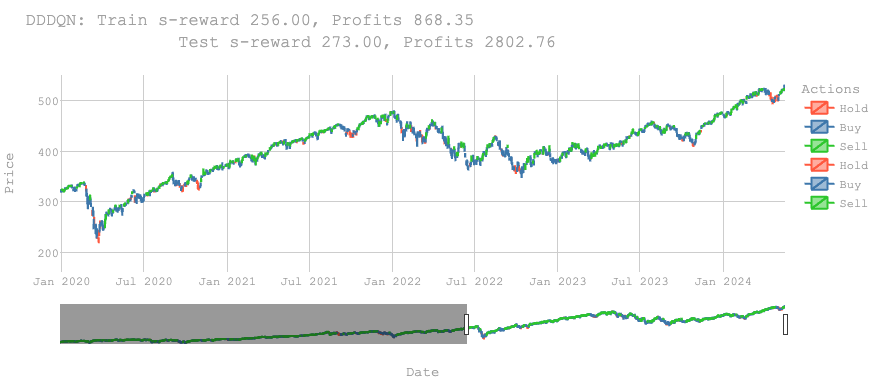
1-Feature Model Double Dualing DQN 

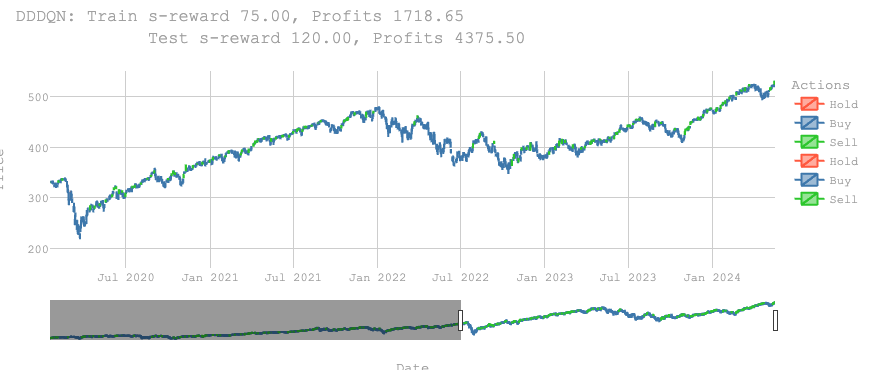
5-Feature Model Double Dualing DQN 

We then compared the performance of each model, focusing on the alignment between the rewards obtained on the training and test datasets. The close alignment of rewards across both datasets indicates that using 1/3 of the data for training allowed the models to achieve long-term generalization over the remaining 2/3 of the test data, even in a volatile environment. This demonstrates the models' robustness and ability to adapt to new, unseen data effectively. When test set rewards are close to train set rewards, it is a positive indicator of the model's performance and generalization capability. It suggests that the model is not overfitting to the training data and is able to adapt well to unseen data. This is particularly important in stock trading environments where market conditions can vary significantly over time. However, the 1-Feature Model is more vulnerable to fauctuation and often under perform when environment change rapidly like NVDA.


| Model              | SPY-1 Feature Rewards  | SPY-5 Feature Rewards | NVDA-1 Feature Rewards | NVDA-5 Feature Rewards |
|--------------------|----------------|-------|-------|-------|
| DQN Train               | 237.00| 76.00| 256.00| 72.00|
| DQN Test               | 150.00| 101.00| 218.00| 100.00|
| Double DQN Train        | 242.00| 112.00| 259.00| 51.00|
| Double DQN Test        | 273.00| 88.00| 152.00| 87.00|
| Dualing DQN Train       | 253.00| 145.00| 264.00| 120.00|
| Dualing DQN Test       | 211.00| 80.00| 119.00| 85.00|
| Dualing Double DQN Train | 256.00| 29.00| 276.00| 98.00|
| Dualing Double DQN Test | 273.00| 62.00| 212.00| 85.00|


We used three indicators to evaluate the performance of each model during training: Total Loss (computed from the mean square error between the Q value and target Q value) for each training epoch, total reward for each training epoch, and the mean next Q value from all states of each epoch. From the graphs, we observe that Double DQN usually starts with lower total loss and overall lower Q-mean values compared to the other models. This indicates that Double DQN effectively mitigates the overestimation issue of Q values.

Dueling DQN, on the other hand, provides a more stable and smooth reward curve than both DQN and Double DQN, despite having higher losses and a higher likelihood of encountering Q value overestimation. When we combine the two approaches, the Dueling Double DQN demonstrates good control in total loss and mitigates Q value overestimation while maintaining a stable reward curve.

However, for the 5-feature models, the total reward plot shows more fluctuations and sudden spikes. This behavior is mainly attributed to the Dropout function and changes in the environment. Therefore, the data range are pick mostly from the stable interval after 100 epoch.

| Model              | SPY-1 Feature Max Loss/Rewards Range  | SPY-5 Feature Max Loss/Rewards Range/Mean-Q value Range | NVDA-1 Feature Max Loss/Rewards Range/Mean-Q value Range | NVDA-5 Feature Max Loss/Rewards Range |
|--------------------|----------------|-------|-------|-------|
| DQN Train               | 562/130~200| 7135/0~40/2.8~3.2| 387/180~230| 2055/35~80/2.4~3.0|
| Double DQN Train        | 178/160~200| 2053/35~80/2.4~3.1| 1298/180~220| 632/5~40/1.7~2.2|
| Dualing DQN Train       | 9759/150~190| 4233/60~90/3.4~3.9| 1862/190~220| 1743/60~90/3.2~3.7|
| Dualing Double DQN Train | 264/180~220| 2802/40~70/2.4~3.0| 60/200~230| 1198/60~90/2.9~3.5|

All the data can be found in Section 6

# 6.Intrepretation and visualization

## 5-Features Model Results

### Loss and Reward Plot for DQN NVDA

In [51]:
plot_loss_reward(total_losses_dqn, total_rewards_dqn, all_q_values_dqn)

### Loss and Reward Plot for DQN SPY

In [73]:
plot_loss_reward(total_losses_dqn2, total_rewards_dqn2, all_q_values_dqn2)

### Loss and Reward Plot for Double DQN NVDA

In [53]:
plot_loss_reward(total_losses_ddqn, total_rewards_ddqn, all_q_values_ddqn)

### Loss and Reward Plot for Double DQN SPY

In [54]:
plot_loss_reward(total_losses_ddqn2, total_rewards_ddqn2, all_q_values_ddqn2)

### Loss and Reward Plot for Dueling DQN NVDA

In [55]:
plot_loss_reward(total_losses_dueldqn, total_rewards_dueldqn, all_q_values_dueldqn)

### Loss and Reward Plot for Dueling DQN SPY

In [74]:
plot_loss_reward(total_losses_dueldqn2, total_rewards_dueldqn2, all_q_values_dueldqn2)

### Loss and Reward Plot for Double Dueling DQN NVDA

In [57]:
plot_loss_reward(total_losses_dddqn, total_rewards_dddqn, all_q_values_dddqn)

### Loss and Reward Plot for Double Dueling DQN SPY

In [75]:
plot_loss_reward(total_losses_dddqn2, total_rewards_dddqn2, all_q_values_dddqn2)

In [60]:
plot_train_test_by_q(Environment1(train), Environment1(test), qnetwork_local_dqn, 'DQN NVDA')

In [61]:
plot_train_test_by_q(Environment1(train), Environment1(test), qnetwork_local_ddqn, 'Double DQN NVDA')

In [66]:
plot_train_test_by_q(Environment1(train), Environment1(test), qnetwork_local_dueldqn, 'Dueling DQN NVDA')

In [65]:
plot_train_test_by_q(Environment1(train), Environment1(test), qnetwork_local_dddqn, 'Double Dueling DQN NVDA')

In [76]:
plot_train_test_by_q(Environment1(train2), Environment1(test2), qnetwork_local_dqn2, 'DQN SPY')

In [67]:
plot_train_test_by_q(Environment1(train2), Environment1(test2), qnetwork_local_ddqn2, 'Double DQN SPY')

In [77]:
plot_train_test_by_q(Environment1(train2), Environment1(test2), qnetwork_local_dueldqn2, 'Dueling DQN SPY')

In [80]:
plot_train_test_by_q(Environment1(train2), Environment1(test2), qnetwork_local_dddqn2, 'Double Dueling DQN SPY')

## 1-Feature Model Result of SPY
For how the one feature model run, please check the file DQN_TEST_single_feature_spy.ipynb

### DQN

![Screen Shot 2024-05-20 at 12.41.52 PM.png](<attachment:Screen Shot 2024-05-20 at 12.41.52 PM.png>)
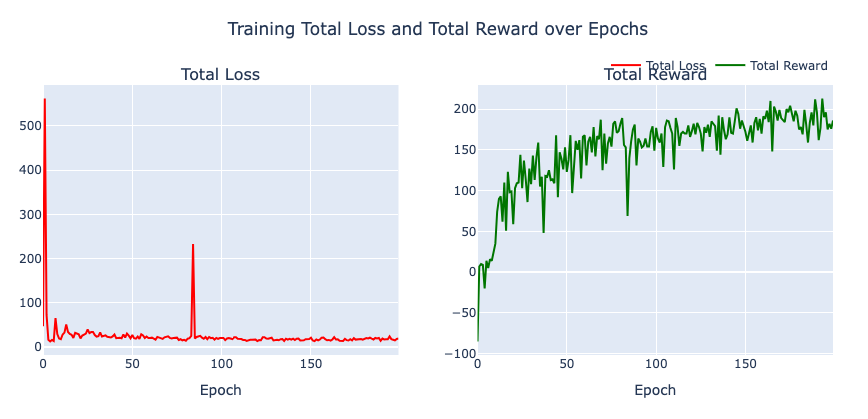

![Screen Shot 2024-05-20 at 12.44.00 PM.png](<attachment:Screen Shot 2024-05-20 at 12.44.00 PM.png>)
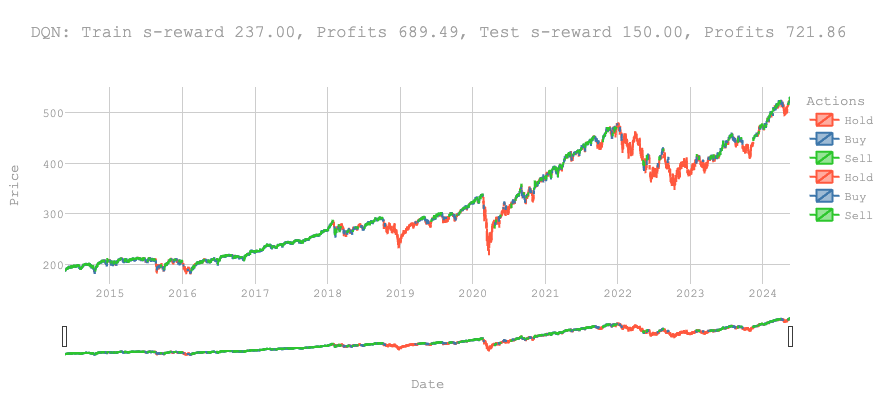

### Double DQN

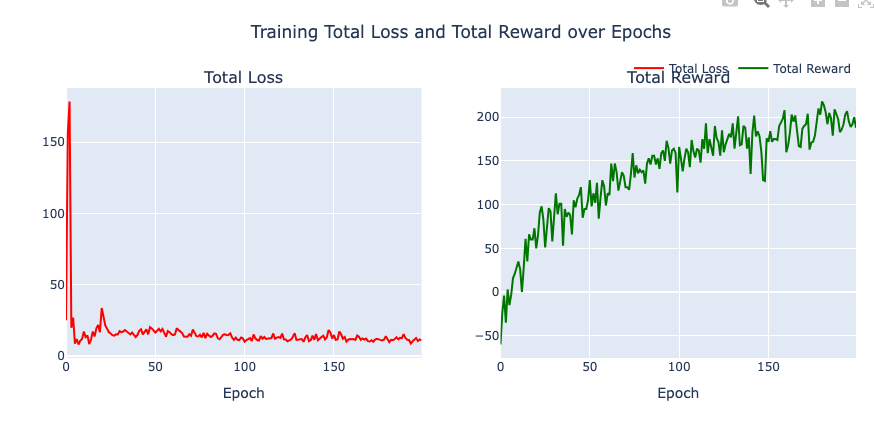

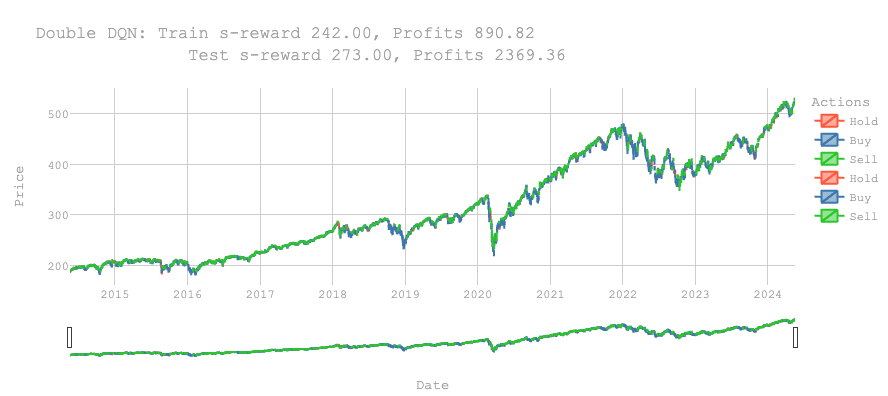

### Dueling DQN

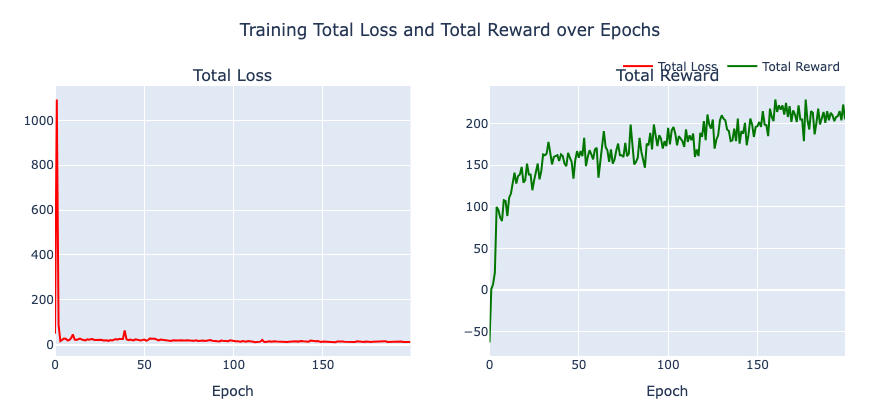

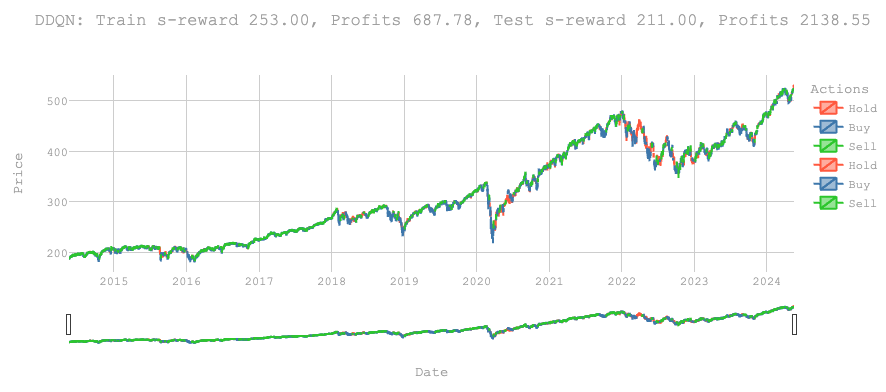

### Double Dueling DQN

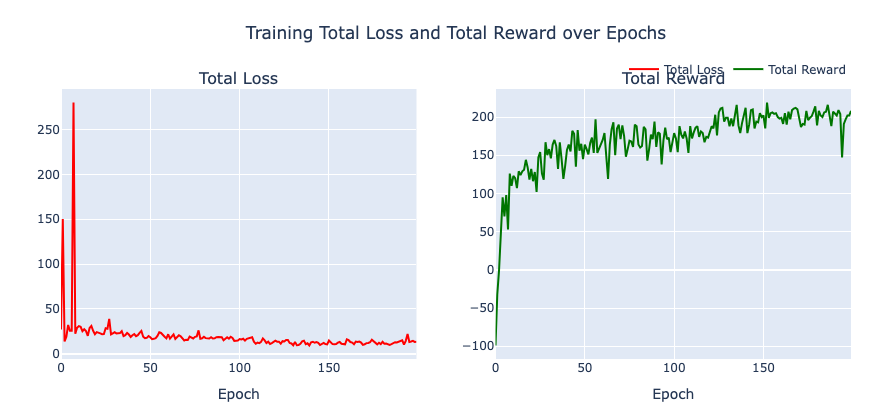

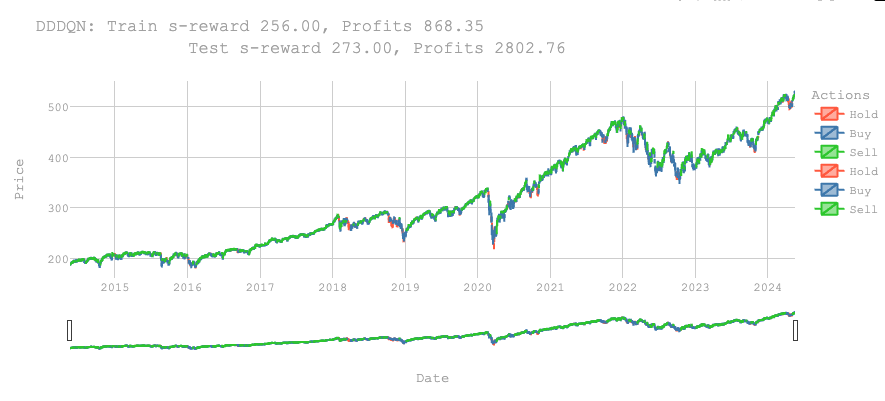

## 1-Feature Model Result of NVDA
For how the one feature model run, please check the file DQN_TEST_single_feature_spy.ipynb and switch the data source to 'NVDA-10'

### DQN

![Screen Shot 2024-05-20 at 2.16.49 PM.png](<attachment:Screen Shot 2024-05-20 at 2.16.49 PM.png>)
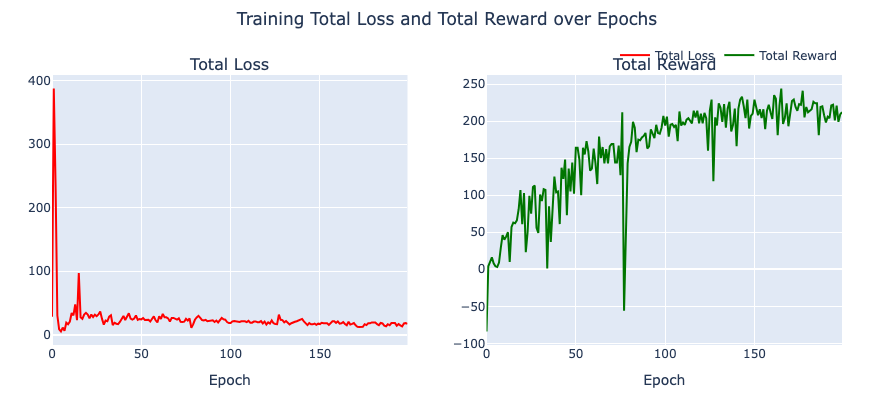

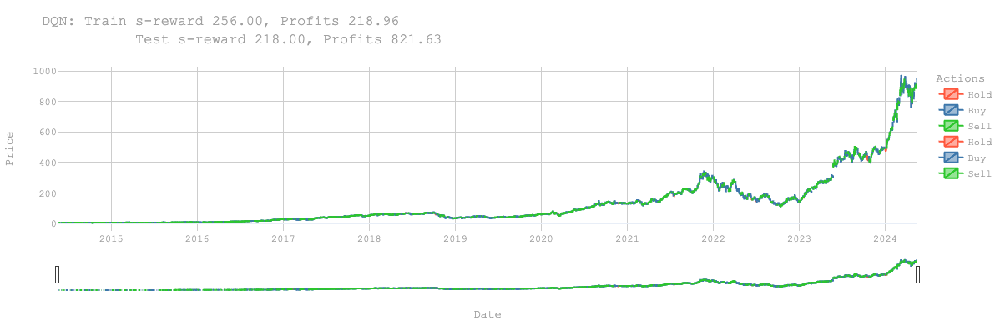

### Double DQN

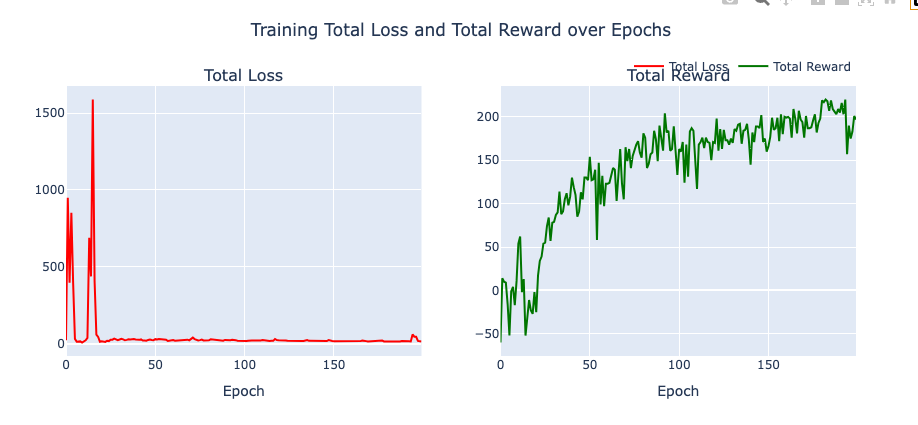

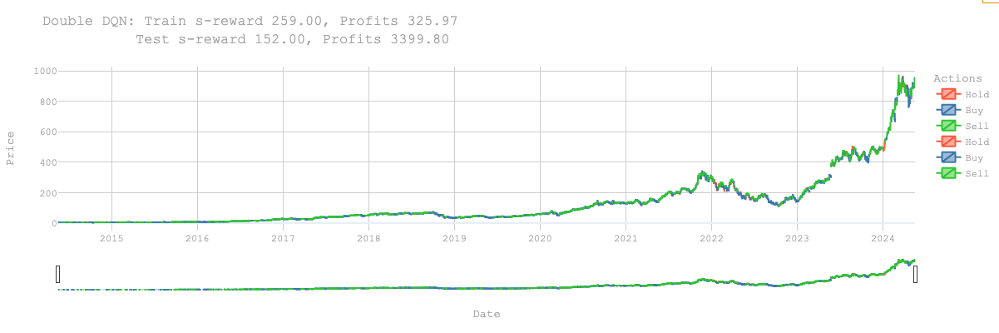

### Dualing DQN

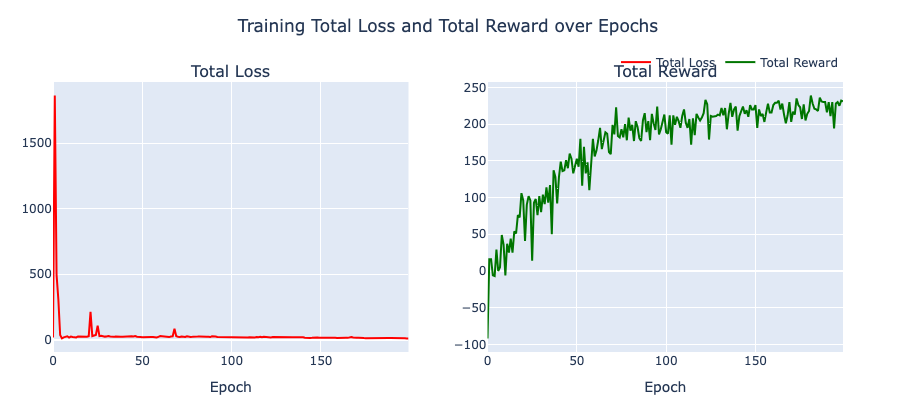

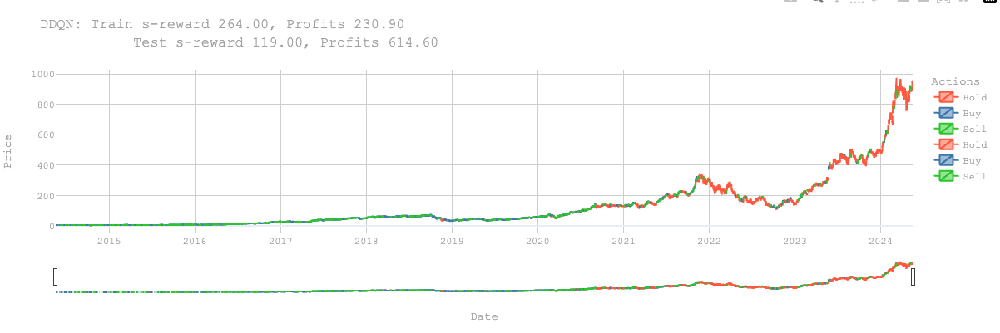

### Dualing Double DQN

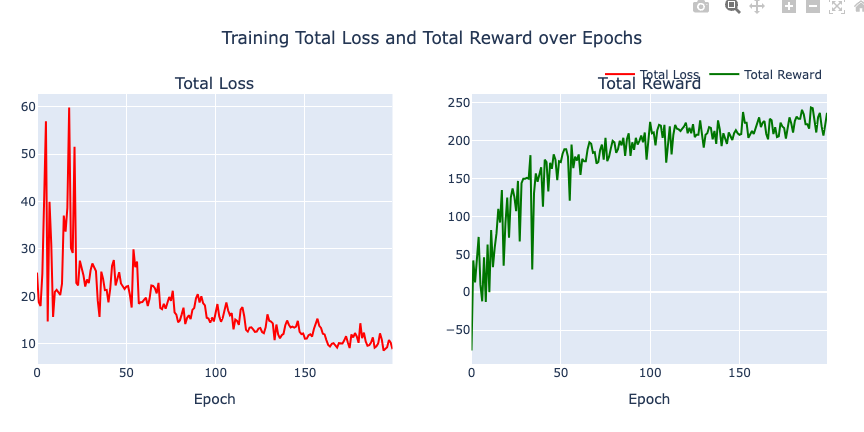

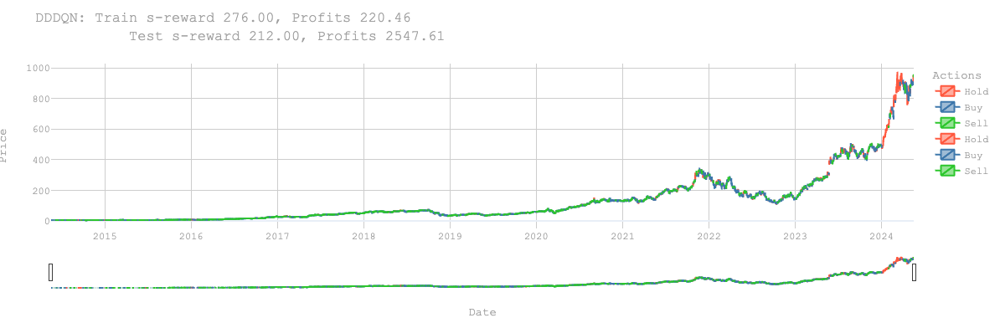

# 7.Conclusion

This report has implemented and evaluated the performance of three distinct types of reinforcement learning algorithms—DQN, Double DQN, Dueling DQN, and Double Dueling DQN—in daily bases stock market trading. We explored their application on various stock datasets, including SPY and NVDA, provided a comprehensive analysis of each method's strengths and weaknesses. 

We can conclude that by realizing Double Dueling DQN combines the benefits of both Double DQN and Dueling DQN, offering the following improvements:

- Mitigating Overestimation: Double DQN helps to address the overestimation problem inherent in standard DQN by using separate networks for action selection and evaluation, leading to more accurate and stable Q-value estimations.

- Enhanced State Representation: The Dueling DQN architecture improves the representation of the value of each state, separately learning the state-value function and the advantage function. This allows the model to better evaluate the importance of each state, regardless of the specific actions taken, enhancing its ability to generalize across different market conditions.

- Improved Stability and Robustness: By combining the strengths of Double DQN and Dueling DQN, Double Dueling DQN achieves greater stability and robustness in training. It is better equipped to handle the high volatility and noise in financial markets, resulting in more consistent and reliable trading performance.

- Handling High-Dimensional Data: The use of neural networks in Double Dueling DQN allows it to efficiently process and learn from high-dimensional data features (such as Open, High, Low, Close, and Volume), uncovering complex non-linear patterns and relationships that traditional methods might miss.

This report has implemented and evaluated the performance of three distinct types of reinforcement learning algorithms—DQN, Double DQN, Dueling DQN, and Double Dueling DQN—in daily bases stock market trading. We explored their application on various stock datasets, including SPY and NVDA, provided a comprehensive analysis of each method's strengths and weaknesses. 

Overall, through this project, we hope to provide valuable insights into the effective utilization of deep reinforcement learning in financial market, highlighting the advantages of advanced techniques like Double Dueling DQN in developing robust, adaptive trading strategies for the complex and volatile stock market.

# 8.Reference
Ning, B., Ho, F., Ling, T. and Jaimungal, S. (2018). Double Deep Q-Learning for Optimal
Execution

Dabérius, K., Granat, E. and Karlsson, P. (2019). Deep Execution - Value and Policy
Based Reinforcement Learning for Trading and Beating Market Benchmarks. SSRN
Electronic Journal.

HASSELT V H, GUEZ A, SILVER D. Deep reinforcement learning with double q-learning [C]// Proceedings of the AAAI conference on artificial intelligence. 2016, 30(1).

WANG Z, SCHAUL T, HESSEL M, et al. Dueling network architectures for deep reinforcement learning [C]// International conference on machine learning, PMLR, 2016: 1995-2003.

HESSEL M, MODAYIL J, HASSELT V H, et al. Rainbow: Combining improvements in deep reinforcement learning [C]// Thirty-second AAAI conference on artificial intelligence, 2018.

Volodymyr Mnih, Koray Kavukcuoglu, David Silver, Andrei A Rusu, Joel Veness, Marc G Bellemare, Alex Graves, Martin Riedmiller, Andreas K Fidjeland, Georg Ostrovski, et al. Human-level control through deep reinforcement learning. nature, 518(7540):529–533, 2015.

B. -A. Han and J. -J. Yang, "Research on Adaptive Job Shop Scheduling Problems Based on Dueling Double DQN," in IEEE Access, vol. 8, pp. 186474-186495, 2020, doi: 10.1109/ACCESS.2020.3029868.

## Contribution

Yutian Lei: 100%